# End-to end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The data used in this notebook is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:

* We're dealing with images (unstructured data), so it's probably best to use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images do not have labels, because we'll want to predict them).

## 5. Modeling

### 5.1. Getting the workspace ready

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub


print(f'TF version: {tf.__version__}')
print(f'TF hub version: {hub.__version__}')
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'not available')

TF version: 2.15.0
TF hub version: 0.16.1
GPU available


### 5.2. Getting the data ready

In [6]:
import pandas as pd
import pathlib

labels_csv = pd.read_csv('/content/drive/MyDrive/Dog Classification Project/dog-breed-identification/labels.csv')
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

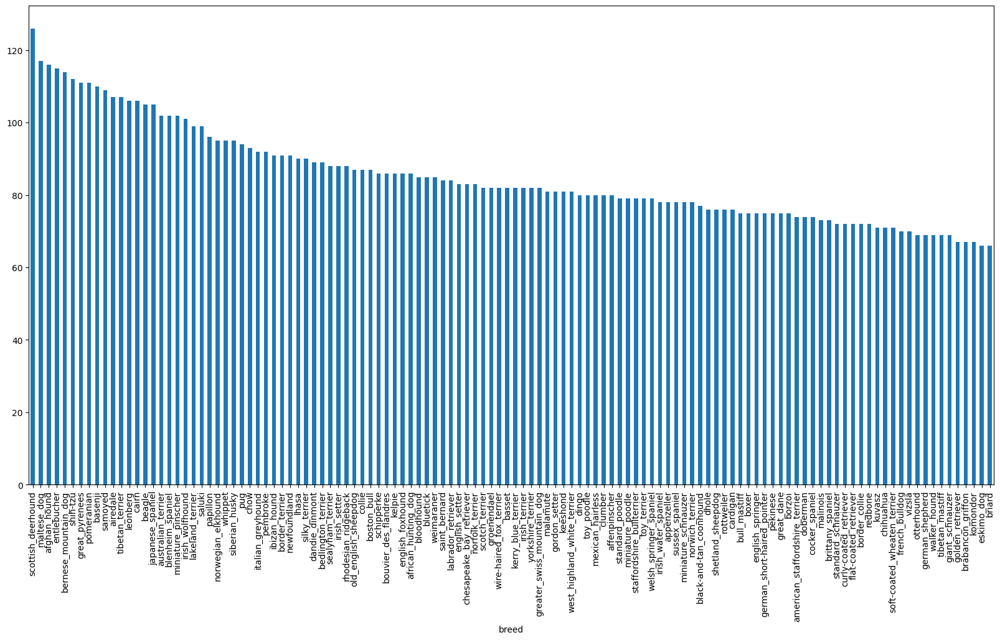

In [ ]:
# How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

### 5.3. Getting images and their labels

In [ ]:
filenames = [f'drive/MyDrive/Dog Classification Project/dog-breed-identification/train/{filename}.jpg' for filename in labels_csv['id']]
filenames[:10]

['drive/MyDrive/Dog Classification Project/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Classification Project/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Classification Project/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Classification Project/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Classification Project/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Classification Project/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Classification Project/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Classification Project/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Classification Project/dog-breed-identification/train/003df8b8a8b05244b1d920

In [ ]:
len(filenames)

10222

In [ ]:
labels_csv['id'].value_counts().sum()

10222

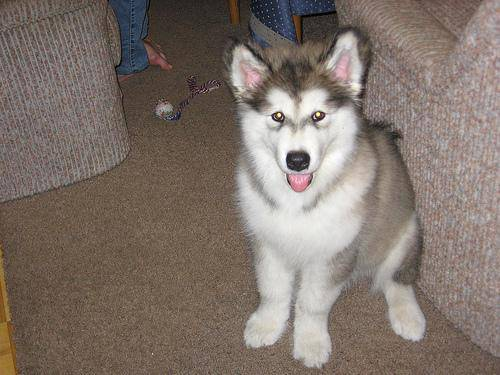

In [ ]:
from IPython.display import Image

Image(filenames[3000])

In [ ]:
import numpy as np

labels = labels_csv['breed']
labels_array = np.array(labels)
labels_array

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels_array)

10222

In [ ]:
len(filenames)

10222

In [ ]:
unique_breeds = np.unique(labels_array)

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turning every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels_array]
len(boolean_labels)

10222

In [ ]:
# Turning the boolean array into integers
boolean_array = [boolean_label.astype(int) for boolean_label in boolean_labels]

In [ ]:
boolean_array[0]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

### 5.4. Creating a validation set

Since the dataset from Kaggle doesn't come with a validation set, one has to be created.

In [ ]:
# Setting up X & y variables

X = filenames
y = boolean_array

In [ ]:
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(
    X[:NUM_IMAGES],
    y[:NUM_IMAGES],
    test_size=0.2,
    random_state=42
)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

### 5.5. Preprocessing images (turning images into Tensors)

In [ ]:
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
    """
    Takes an image file path and turns the image into a Tensor.
    """

    # Reading in an image file
    image = tf.io.read_file(image_path)

    # Turning the jpeg image into numerical Tesnor with 3 color channels (red, green, blue)
    image = tf.image.decode_jpeg(
        image,
        channels=3
    )

    # Normalizing tha image (convert the color channel values from 0-255 to 0-1 values)
    image = tf.image.convert_image_dtype(
        image,
        tf.float32
    )

    # Resizing the image to the desired value (224, 224)
    image = tf.image.resize(
        image,
        size=[img_size, img_size]
    )

    return image

In [ ]:
process_image(filenames[0])

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.5705322 , 0.33588538, 0.15008473],
        [0.66901225, 0.4601166 , 0.26022965],
        [0.61062384, 0.43763596, 0.21601713],
        ...,
        [0.8182312 , 0.7297958 , 0.26963907],
        [0.72454786, 0.6059109 , 0.2653059 ],
        [0.7494603 , 0.6252918 , 0.32456532]],

       [[0.6761415 , 0.4733761 , 0.30642927],
        [0.5672121 , 0.38192675, 0.20349538],
        [0.5883547 , 0.4322571 , 0.2403155 ],
        ...,
        [0.9326942 , 0.8260503 , 0.41093278],
        [0.86072475, 0.74250627, 0.3694122 ],
        [0.76781666, 0.6461604 , 0.29291284]],

       [[0.46350825, 0.29595745, 0.1536156 ],
        [0.42554107, 0.27039403, 0.12009468],
        [0.7887875 , 0.6547362 , 0.49015   ],
        ...,
        [0.89372385, 0.7696401 , 0.41811958],
        [0.88609535, 0.7585918 , 0.36495727],
        [0.8243601 , 0.69494826, 0.2930575 ]],

       ...,

       [[0.7344025 , 0.4716574 , 0.2559711 ],
        [0.71

### 5.6. Turning the data into batches

Why turn data into batches?

When trying to process a large amount of images in one go, they all might not fit into memory. Doing 32 images (batch size) at a time is ideal.

In order to use TensorFlow effectively, the data must be in the form of Tensor tuples: `(image, label)`.

In [ ]:
def get_image_label(image_path, label):
    """
    Takes an image file path name and the associated label,
    processes the image and returns a tuple of (image, label).
    """

    image = process_image(image_path)

    return image, label

In [ ]:
get_image_label(X[42], y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Creates batches of data out of image (X) and label (y) pairs.
    Shuffles the data if it's training data, but doesn't shuffle if it's validation data.
    Also accepts test data as input (no labels, so `y` defaults to `None`).
    """

    # If the data is a test dataset, there won't be labels
    if test_data:
        print('Creating test data batches...')

        data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
        data_batch = data.map(process_image).batch(batch_size)

        return data_batch

    # If the data is a validation dataset, it doesn't have to be shuffled
    elif valid_data:
        print('Creating validation data batches...')

        data = tf.data.Dataset.from_tensor_slices(
            (
                tf.constant(X), # filepaths
                tf.constant(y), # labels
            )
        )
        # Creates (image, label) tuples (this also turns the image path into a preprocessed image)
        data_batch = data.map(get_image_label).batch(batch_size)

        return data_batch

    else:
        print('Creating training data batches...')

        data = tf.data.Dataset.from_tensor_slices(
            (
                tf.constant(X),
                tf.constant(y),
            )
        )

        # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
        data = data.shuffle(buffer_size=len(X))
        data_batch = data.map(get_image_label).batch(batch_size)

        return data_batch

In [ ]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.int32, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.int32, name=None)))

### 5.7. Visualizing data batches

The data is now in batches, however, these can be a little hard to comprehend, so it helps to visualize it.

In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
    """
    Displays a plot of 25 images and their labels from a data batch.
    """

    plt.figure(figsize=(10, 10))

    for i in range(25):
        ax = plt.subplot(5, 5, i+1)

        plt.imshow(images[i])

        current_breed_index = labels[i].argmax()
        plt.title(unique_breeds[current_breed_index])

        plt.axis('off')

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

In [ ]:
len(train_images), len(train_labels)

(32, 32)

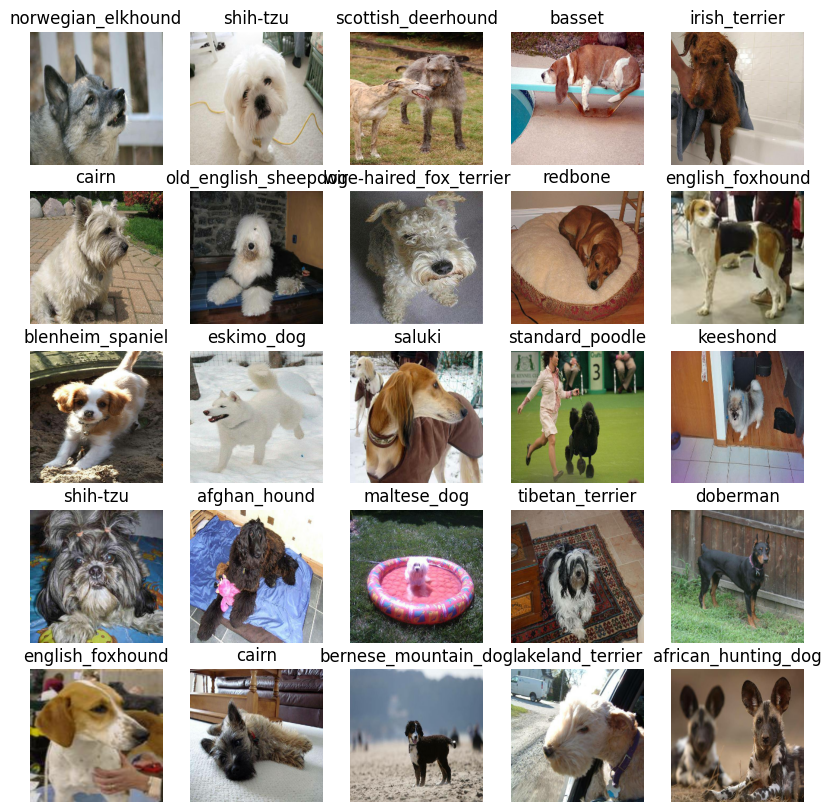

In [ ]:
show_25_images(train_images, train_labels)

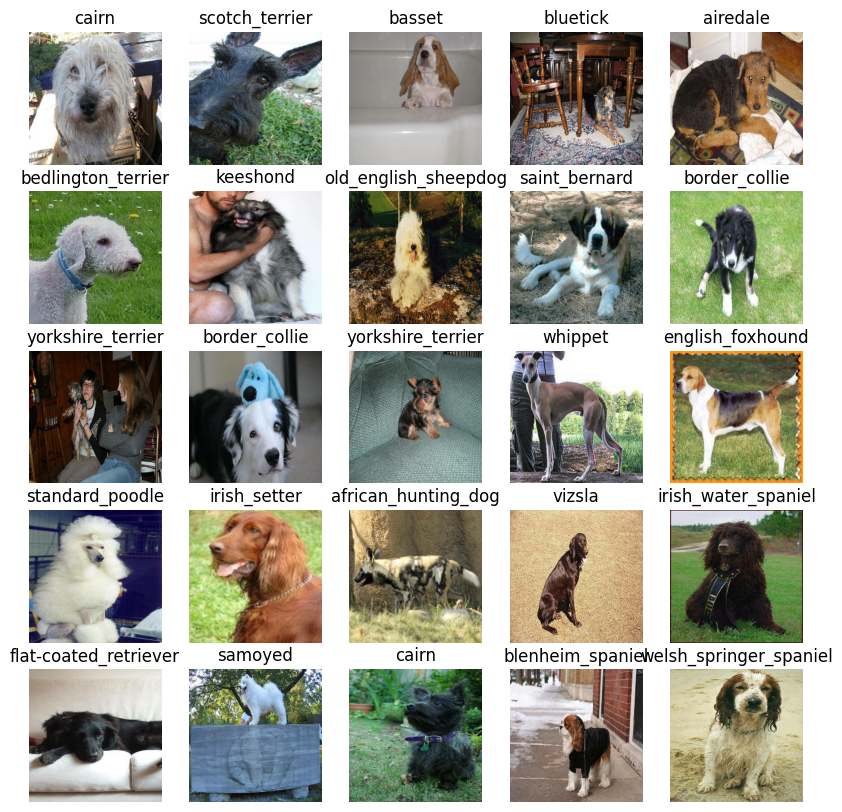

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

### 5.8. Building a model

In [ ]:
# Setting up input shape of the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setting up output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setting up model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4'

In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    """
    Creates a model from a MODEL_URL given an INPUT_SHAPE and an OUTPUT_SHAPE.
    """

    print(f'Building model with: {model_url}')

    # Setting up the model layers
    model = tf.keras.Sequential(
        [
            hub.KerasLayer(model_url), # Layer 1 (input layer)
            tf.keras.layers.Dense(units=output_shape, activation='softmax') # Layer 2 (output layer)
        ]
    )

    # Compiling the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=['accuracy'],
    )

    # Building the model
    model.build(input_shape)

    return model

In [ ]:
model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### 5.9. Creating callbacks

Callbacks are helper functions a model can use during training to do things such as save its progress, check its progress or stop training early if a model stops improving.

#### 5.9.1. TensorBoard Callback

In [ ]:
# Loads TensorBoard notebook extension

%load_ext tensorboard

In [ ]:
import datetime
import os

def create_tensorboard_callback():
    # Creating a log directory for storing TensorBoard logs
    logdir = os.path.join(
        'drive/MyDrive/Dog Classification Project/dog-breed-identification/logs',
        datetime.datetime.now().strftime('%Y%m%d-%H%M%S')
    )

    return tf.keras.callbacks.TensorBoard(logdir)

#### 5.9.2. Early Stopping Callback

Early stopping helps stop the model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',
    patience=3
)

### 5.10. Training a model (on a subset of data)

The first model is only going to train 1000 images to make sure everything is working and minimize time in between experiments.

In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [ ]:
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'not available')

GPU available


In [ ]:
def train_model():
    """
    Trains a given model and returns the trained version.
    """

    # Creating a model
    model = create_model()

    # Creating a new TensorBoard session everytime we train a model
    tensorboard = create_tensorboard_callback()

    # Fitting the model to the data passing it the callbacks
    model.fit(
        x=train_data,
        epochs=NUM_EPOCHS,
        validation_data=val_data,
        validation_freq=1,
        callbacks=[
            tensorboard,
            early_stopping,
        ]
    )

    return model

In [ ]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 109s 4s/step - loss: 4.6014 - accuracy: 0.0850 - val_loss: 3.5612 - val_accuracy: 0.2100
Epoch 2/100
25/25 [==============================] - 4s 162ms/step - loss: 1.6304 - accuracy: 0.6900 - val_loss: 2.3273 - val_accuracy: 0.4650
Epoch 3/100
25/25 [==============================] - 6s 252ms/step - loss: 0.5659 - accuracy: 0.9388 - val_loss: 1.8089 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 6s 226ms/step - loss: 0.2522 - accuracy: 0.9862 - val_loss: 1.6201 - val_accuracy: 0.5800
Epoch 5/100
25/25 [==============================] - 7s 270ms/step - loss: 0.1486 - accuracy: 0.9962 - val_loss: 1.5408 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 4s 173ms/step - loss: 0.1029 - accuracy: 1.0000 - val_loss: 1.4803 - val_accuracy: 0.6250
Epoch 7/100
25/25 [==============================]

It looks like the model is overfitting because it's performing far better on the training dataset than the validation set.

**Note:** Overfitting to begin with is a good thing! It means the model is learning.

### 5.11. Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Classification\ Project/dog-breed-identification/logs

<IPython.core.display.Javascript object>

### 5.12. Making and evaluating predictions using a trained model

In [ ]:
# Making predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 107ms/step


array([[2.13911728e-04, 2.05827484e-04, 3.71933845e-03, ...,
        2.35845699e-04, 3.60904778e-05, 1.02719164e-03],
       [3.42586660e-03, 2.29317043e-03, 9.23852716e-03, ...,
        1.92988245e-03, 2.72944313e-03, 5.17327397e-04],
       [1.77386562e-06, 1.78891150e-05, 1.64263402e-05, ...,
        3.36745929e-04, 5.34313540e-06, 1.15977135e-04],
       ...,
       [3.30967850e-06, 1.70415267e-04, 1.35745222e-05, ...,
        7.83718860e-06, 1.77358874e-04, 1.30660865e-05],
       [2.91136745e-03, 2.12103725e-04, 2.73570535e-04, ...,
        2.77773070e-05, 1.09102057e-05, 6.09182939e-03],
       [3.68175353e-03, 8.81330343e-05, 2.95710703e-03, ...,
        2.43897690e-03, 3.27352784e-03, 3.03377543e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
len(predictions[0])

120

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
index = 0
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

Max value (probability of prediction): 0.3184187412261963
Sum: 1.0
Max index: 26
Predicted label: cairn


In [ ]:
def get_label(prediction_probabilities):
    """
    Turns an array of prediction probabilities into a label.
    """

    return unique_breeds[np.argmax(prediction_probabilities)]

get_label(predictions[0])

'cairn'

In [ ]:
def unbatchify(batch_dataset):
    """
    Takes a batched dataset of (image, label) Tensor and returns separate arrays
    of images and labels.
    """

    images = []
    labels = []

    for image, label in batch_dataset.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])

    return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities, truth_labels, images, n=0):
    """
    View the prediction, ground truth and image for sample n.
    """

    pred_prob, truth_label, image = prediction_probabilities[n], truth_labels[n], images[n]

    pred_label = get_label(pred_prob)

    plt.imshow(image)

    plt.xticks([])
    plt.yticks([])

    title = f'Probability of certainty: {np.max(pred_prob) * 100:2.0f}%, \nPredicted: {pred_label}, \nTruth: {truth_label}'

    if pred_label == truth_label:
        color = 'green'
    else:
        color = 'red'

    plt.title(title, color=color)

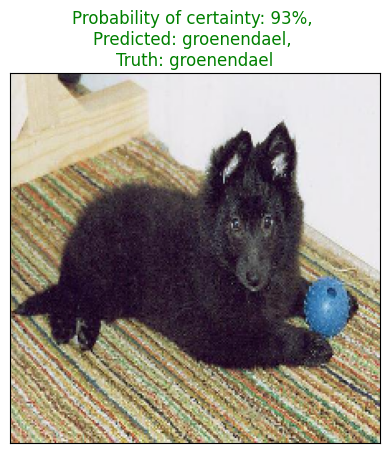

In [ ]:
plot_pred(predictions, val_labels, val_images, n=77)

In [ ]:
def plot_top_pred_confidences(prediction_probabilities, labels, n=0):
    """
    Plots the top 10 highest prediction confidences along with the
    truth label for sample n.
    """

    pred_prob, truth_label = prediction_probabilities[n], labels[n]

    pred_label = get_label(pred_prob)

    # Finding the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

    # Finding the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]

    # Finding the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    top_plot = plt.bar(
        np.arange(len(top_10_pred_labels)),
        top_10_pred_values,
        color='grey'
    )

    plt.xticks(
        np.arange(len(top_10_pred_labels)),
        labels=top_10_pred_labels,
        rotation='vertical'
    )

    if np.isin(truth_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == truth_label)].set_color('green')

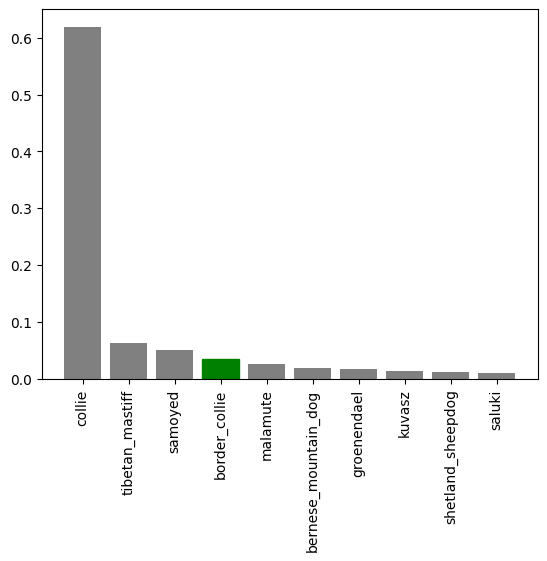

In [ ]:
plot_top_pred_confidences(predictions, val_labels, n=9)

In [ ]:
def plot_predictions_and_confidences(prediction_probabilities, truth_labels, truth_images, n=0, num_rows=5, num_cols=2):
    """
    Plots predictions and their respective prediction confidences starting from
    index `n` up to the number of images specified, where the number of images
    is defined by the number of rows multiplied by the number of columns.
    """

    num_images = num_rows * num_cols

    plt.figure(figsize=(10*num_cols, 5*num_rows))

    for i in range(num_images):
        plt.subplot(num_rows, 2*num_cols, 2*i+1)
        plot_pred(prediction_probabilities, truth_labels, truth_images, i+n)

        plt.subplot(num_rows, 2*num_cols, 2*i+2)
        plot_top_pred_confidences(prediction_probabilities, truth_labels, i+n)

    plt.tight_layout()
    plt.show()


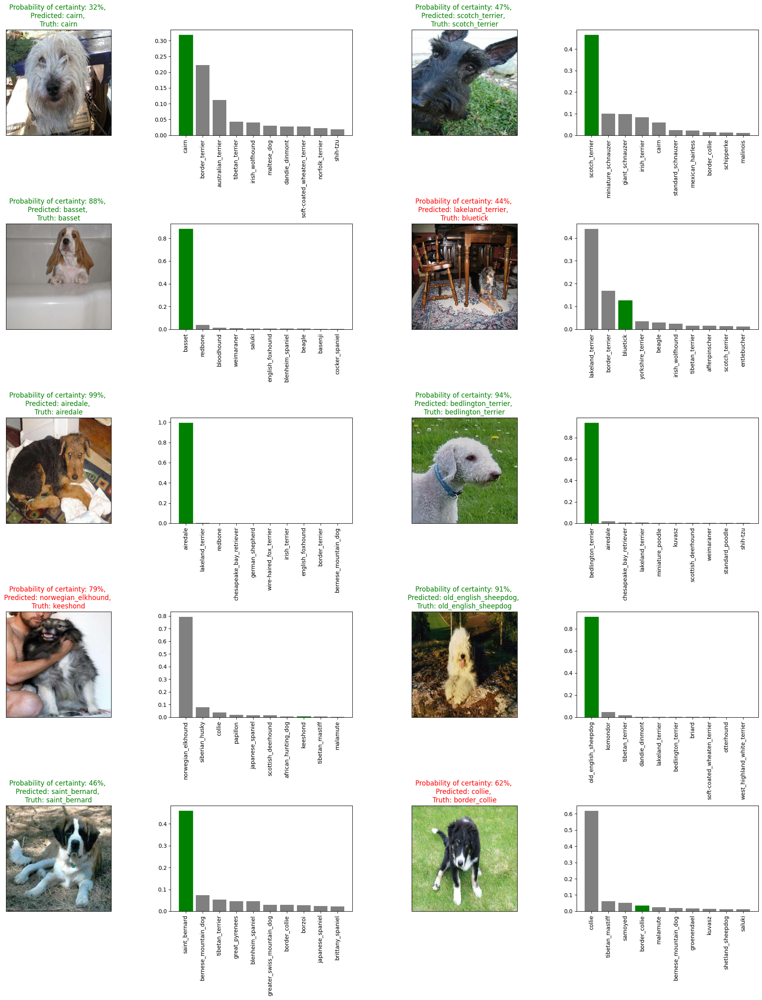

In [ ]:
plot_predictions_and_confidences(predictions, val_labels, val_images, n=0)

### 5.13. Saving and loading a model

In [ ]:
def save_model(model, suffix=None):
    """
    Saves a given model in a models directory and appends a suffix (string).
    """

    modeldir = os.path.join(
        'drive/MyDrive/Dog Classification Project/dog-breed-identification/models',
        datetime.datetime.now().strftime('%Y%m%d-%H%M%S')
    )
    model_path = f'{modeldir}-{suffix}.h5'

    print(f'Saving model to: {model_path}...')

    model.save(model_path)

    return model_path

In [ ]:
def load_model(model_path):
    """
    Loads a saved model from a specified path.
    """

    print(f'Loading saved model from: {model_path}...')

    model = tf.keras.models.load_model(
        model_path,
        custom_objects={'KerasLayer': hub.KerasLayer}
    )

    return model

In [ ]:
model_path = save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: drive/MyDrive/Dog Classification Project/dog-breed-identification/models/20240511-034721-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
loaded_1000_image_model = load_model(model_path)

Loading saved model from: drive/MyDrive/Dog Classification Project/dog-breed-identification/models/20240511-034721-1000-images-mobilenetv2-Adam.h5...


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 103ms/step - loss: 1.3578 - accuracy: 0.6400


[1.3578484058380127, 0.6399999856948853]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 97ms/step - loss: 1.3578 - accuracy: 0.6400


[1.3578484058380127, 0.6399999856948853]

### 5.14. Training a model on the full data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Creating a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))>

In [ ]:
# Creating a model for full data
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
full_model_tensorboard = create_tensorboard_callback()

In [ ]:
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='accuracy',
    patience=3
)

In [ ]:
full_model.fit(
    x=full_data,
    epochs=NUM_EPOCHS,
    callbacks=[
        full_model_tensorboard,
        full_model_early_stopping,
    ]
)

Epoch 1/100
320/320 [==============================] - 1046s 3s/step - loss: 1.3357 - accuracy: 0.6744
Epoch 2/100
320/320 [==============================] - 47s 147ms/step - loss: 0.3965 - accuracy: 0.8837
Epoch 3/100
320/320 [==============================] - 41s 128ms/step - loss: 0.2372 - accuracy: 0.9366
Epoch 4/100
320/320 [==============================] - 45s 139ms/step - loss: 0.1512 - accuracy: 0.9640
Epoch 5/100
320/320 [==============================] - 41s 128ms/step - loss: 0.1070 - accuracy: 0.9779
Epoch 6/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0767 - accuracy: 0.9865
Epoch 7/100
320/320 [==============================] - 53s 165ms/step - loss: 0.0580 - accuracy: 0.9923
Epoch 8/100
320/320 [==============================] - 42s 129ms/step - loss: 0.0447 - accuracy: 0.9951
Epoch 9/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0358 - accuracy: 0.9971
Epoch 10/100
320/320 [==============================] - 44s 136ms

In [ ]:
full_model_path = save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to: drive/MyDrive/Dog Classification Project/dog-breed-identification/models/20240511-042747-full-image-set-mobilenetv2-Adam.h5...


In [ ]:
loaded_full_model = load_model(full_model_path)

Loading saved model from: drive/MyDrive/Dog Classification Project/dog-breed-identification/models/20240511-042747-full-image-set-mobilenetv2-Adam.h5...


### 5.15. Making predictions on the test dataset

Since the model has been trained on images in the form of Tensor batches, to make predictions on the test data, it is necessary to get into the same format.

In [ ]:
# Loading test image filenames
test_path = 'drive/MyDrive/Dog Classification Project/dog-breed-identification/test/'
test_filenames = [test_path + filename for filename in os.listdir(test_path)]
test_filenames[0]

'drive/MyDrive/Dog Classification Project/dog-breed-identification/test/e1444b7c629f6775432269bfd9c7e758.jpg'

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(
    test_filenames,
    test_data=True
)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions = loaded_full_model.predict(
    test_data,
    verbose=1
)

324/324 [==============================] - 223s 677ms/step


In [ ]:
# Saving predictions (NumPy array) to csv file (for access later)
np.savetxt(
    'drive/MyDrive/Dog Classification Project/preds_array.csv',
    test_predictions,
    delimiter=','
)

In [ ]:
loaded_test_predictions = np.loadtxt(
    'drive/MyDrive/Dog Classification Project/preds_array.csv',
    delimiter=','
)

### 5.16. Preparing test dataset prediction for Kaggle

Looking at the Kaggle sample submission, we find that it wants the model prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

In [ ]:
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1444b7c629f6775432269bfd9c7e758,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ddfbebe13aa8fba30f347c58466215df,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e3f04efb648b110b2eb04b9c041504d8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e4a8dfc6e219b20a0cbced41eaf6a435,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e4c49d7e028965d3504b0862633464c3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1444b7c629f6775432269bfd9c7e758,1.794855e-10,5.394601e-12,1.867982e-10,4.878885e-10,7.724290e-07,1.984032e-04,1.066557e-09,5.183242e-07,4.637196e-08,...,1.663011e-08,3.458994e-10,6.096019e-10,1.643662e-07,1.301371e-09,8.694651e-10,4.965736e-10,6.319330e-08,2.798726e-11,2.115853e-10
1,ddfbebe13aa8fba30f347c58466215df,6.216211e-12,4.939151e-12,4.769399e-12,6.362198e-10,8.525433e-08,2.715594e-08,3.282911e-09,2.464285e-09,2.009364e-07,...,8.709949e-11,3.100824e-10,8.055975e-10,5.064320e-06,2.514687e-08,7.135891e-10,2.455396e-11,1.157676e-11,4.852408e-10,1.881399e-09
2,e3f04efb648b110b2eb04b9c041504d8,8.408765e-09,1.344332e-07,4.888664e-11,7.595245e-11,1.366011e-07,7.465855e-13,3.222483e-07,2.039906e-10,7.057079e-09,...,2.369600e-05,1.399015e-09,3.951323e-09,1.812678e-09,1.025507e-08,1.226191e-10,9.122649e-04,4.807215e-10,1.330209e-07,3.495852e-10
3,e4a8dfc6e219b20a0cbced41eaf6a435,6.333578e-10,2.698493e-09,6.732819e-10,5.824425e-06,7.369960e-09,5.575567e-05,1.198704e-05,6.720878e-05,2.022879e-05,...,3.401859e-07,7.054525e-07,2.907166e-06,1.377105e-01,1.544371e-07,2.656434e-09,7.245890e-10,4.198512e-07,4.734778e-06,4.224983e-10
4,e4c49d7e028965d3504b0862633464c3,2.550470e-10,1.587294e-10,1.345741e-12,1.171412e-16,2.475571e-11,6.258319e-15,4.880736e-12,1.875039e-11,1.432448e-10,...,6.395190e-05,3.285890e-12,6.649193e-10,4.349277e-13,5.889386e-10,1.047535e-12,1.223929e-08,5.557695e-14,1.205317e-08,5.564848e-09


In [ ]:
preds_df.to_csv(
    'drive/MyDrive/Dog Classification Project/dog-breed-identification/full_model_predictions_submission_1_mobilenetv2.csv',
    index=False
)

### 5.17. Making predictions on custom images

In [ ]:
custom_path = '/content/drive/MyDrive/Dog Classification Project/dog-breed-identification/my_dog_photos/'
custom_image_paths = [custom_path + filename for filename in os.listdir(custom_path)]

In [ ]:
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds = loaded_full_model.predict(custom_data)
custom_preds.shape

1/1 [==============================] - 1s 1s/step


(3, 120)

In [ ]:
custom_pred_labels = [get_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['chihuahua', 'pug', 'chihuahua']

In [ ]:
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)

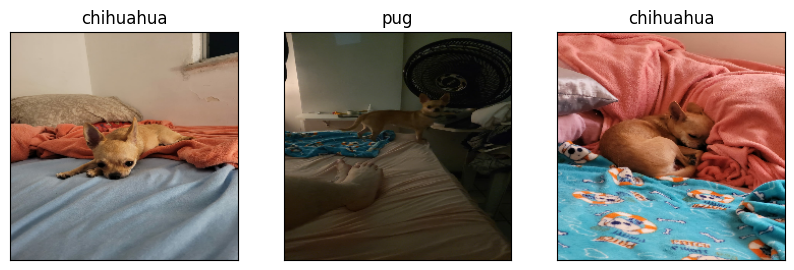

In [ ]:
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
    plt.subplot(1, 3, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)